In [2]:
#Loading the resource libraries crucial for the analysis
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from pywaffle import Waffle
from unittest.mock import patch

In [4]:
#Loading the Dataset 2
cs = pd.read_csv('mxmh_survey_results.csv')

In [5]:
#Calling the dataset to check the structure and identify the varibales
cs

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
2,8/27/2022 21:28:18,18.0,Spotify,4.0,No,No,No,Video game music,No,Yes,...,Never,Rarely,Rarely,Very frequently,7.0,7.0,10.0,2.0,No effect,I understand.
3,8/27/2022 21:40:40,61.0,YouTube Music,2.5,Yes,No,Yes,Jazz,Yes,Yes,...,Sometimes,Never,Never,Never,9.0,7.0,3.0,3.0,Improve,I understand.
4,8/27/2022 21:54:47,18.0,Spotify,4.0,Yes,No,No,R&B,Yes,No,...,Very frequently,Very frequently,Never,Rarely,7.0,2.0,5.0,9.0,Improve,I understand.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,10/30/2022 14:37:28,17.0,Spotify,2.0,Yes,Yes,No,Rock,Yes,Yes,...,Never,Rarely,Very frequently,Never,7.0,6.0,0.0,9.0,Improve,I understand.
732,11/1/2022 22:26:42,18.0,Spotify,1.0,Yes,Yes,No,Pop,Yes,Yes,...,Never,Never,Sometimes,Sometimes,3.0,2.0,2.0,5.0,Improve,I understand.
733,11/3/2022 23:24:38,19.0,Other streaming service,6.0,Yes,No,Yes,Rap,Yes,No,...,Sometimes,Sometimes,Rarely,Rarely,2.0,2.0,2.0,2.0,Improve,I understand.
734,11/4/2022 17:31:47,19.0,Spotify,5.0,Yes,Yes,No,Classical,No,No,...,Never,Never,Never,Sometimes,2.0,3.0,2.0,1.0,Improve,I understand.


In [8]:
#Reaffirming the shape of the entire dataset
cs.shape

(736, 33)

In [9]:
#Figuring out the data types
cs.dtypes

Timestamp                        object
Age                             float64
Primary streaming service        object
Hours per day                   float64
While working                    object
Instrumentalist                  object
Composer                         object
Fav genre                        object
Exploratory                      object
Foreign languages                object
BPM                             float64
Frequency [Classical]            object
Frequency [Country]              object
Frequency [EDM]                  object
Frequency [Folk]                 object
Frequency [Gospel]               object
Frequency [Hip hop]              object
Frequency [Jazz]                 object
Frequency [K pop]                object
Frequency [Latin]                object
Frequency [Lofi]                 object
Frequency [Metal]                object
Frequency [Pop]                  object
Frequency [R&B]                  object
Frequency [Rap]                  object


In [10]:
#Loading the information summary 
cs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 736 entries, 0 to 735
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Timestamp                     736 non-null    object 
 1   Age                           735 non-null    float64
 2   Primary streaming service     735 non-null    object 
 3   Hours per day                 736 non-null    float64
 4   While working                 733 non-null    object 
 5   Instrumentalist               732 non-null    object 
 6   Composer                      735 non-null    object 
 7   Fav genre                     736 non-null    object 
 8   Exploratory                   736 non-null    object 
 9   Foreign languages             732 non-null    object 
 10  BPM                           629 non-null    float64
 11  Frequency [Classical]         736 non-null    object 
 12  Frequency [Country]           736 non-null    object 
 13  Frequ

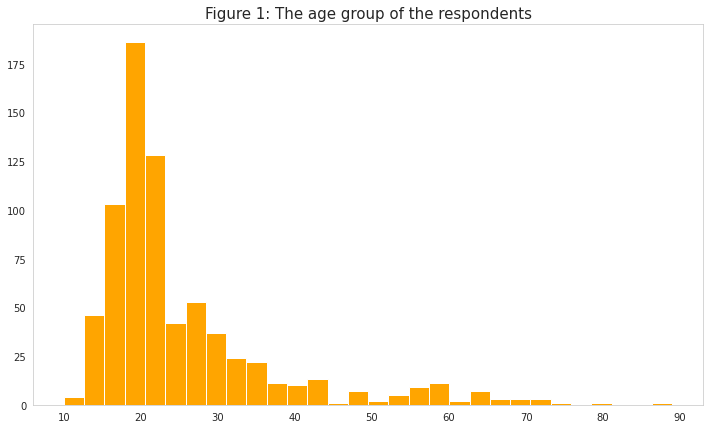

In [125]:
#Figure 1: The age group of the respondents
#Using the numpy to plot a histogram of the age of the surveyed people 

cs.hist(['Age'], bins=30, color='orange', grid=False, figsize=(12, 7))
plt.title('Figure 1: The age group of the respondents',fontsize=15)

plt.show()

In [55]:
#Calling the dataset after specifing the column and rows required for the analysis of the popularity of streaming platforms
cs1 = pd.read_csv('mxmh_survey_results.csv', usecols= [2], nrows=736)

In [56]:
#Calling the dataset to check the intended structure
cs1

,Primary streaming service
0,Spotify
1,Pandora
2,Spotify
3,YouTube Music
4,Spotify
...,...
731,Spotify
732,Spotify
733,Other streaming service
734,Spotify


In [57]:
#Calling the .value_counts() feature to calculate the number of people using specific streaming platforms
cs1['Primary streaming service'].value_counts()

Spotify                              458
YouTube Music                         94
I do not use a streaming service.     71
Apple Music                           51
Other streaming service               50
Pandora                               11
Name: Primary streaming service, dtype: int64

In [102]:
#Figure 2: The method of accessing music
#Calling the MatPlotLib to draw a pie (doughnut) chart for the number of people using online streaming vs. traditional methods

plt.figure(figsize=(12, 7), 
           dpi = 1200) 
plt.tick_params(labelsize = 25)

names = ['Online Streaming (90.34%)', 'Traditional Methods (9.66%)']
size = [664,71]

my_circle = plt.Circle( (0,0), 0.7, color='white')

plt.pie(size, labels=names, colors=['darkslateblue','tomato'])
ax=plt.gcf()
ax.gca().add_artist(my_circle)
ax.legend()
plt.title('Figure 2:The method of accessing music',fontsize=15)

plt.show()

In [128]:
#Figure 3: The popularity of streaming platforms
#Using MatPlotLib, creating a bar plot to showcase the specific number of people using particular streaming platforms

plt.figure(figsize=(12, 7), 
           dpi = 1200) 
plt.tick_params(axis = 'x', labelsize = 17)
plt.tick_params(axis = 'y', labelsize = 17)

ax = cs1['Primary streaming service'].value_counts().plot.barh()
ax.invert_yaxis()
ax.set_xlabel('Frequency', fontsize=18)
ax.set_title('Figure 3: The popularity of streaming platforms',fontsize=19)
ax.legend()

plt.show()

In [62]:
#Calling the .value_counts() feature to fetch the number of people who listen to music in their workplaces
cs['While working'].value_counts()

Yes    579
No     154
Name: While working, dtype: int64

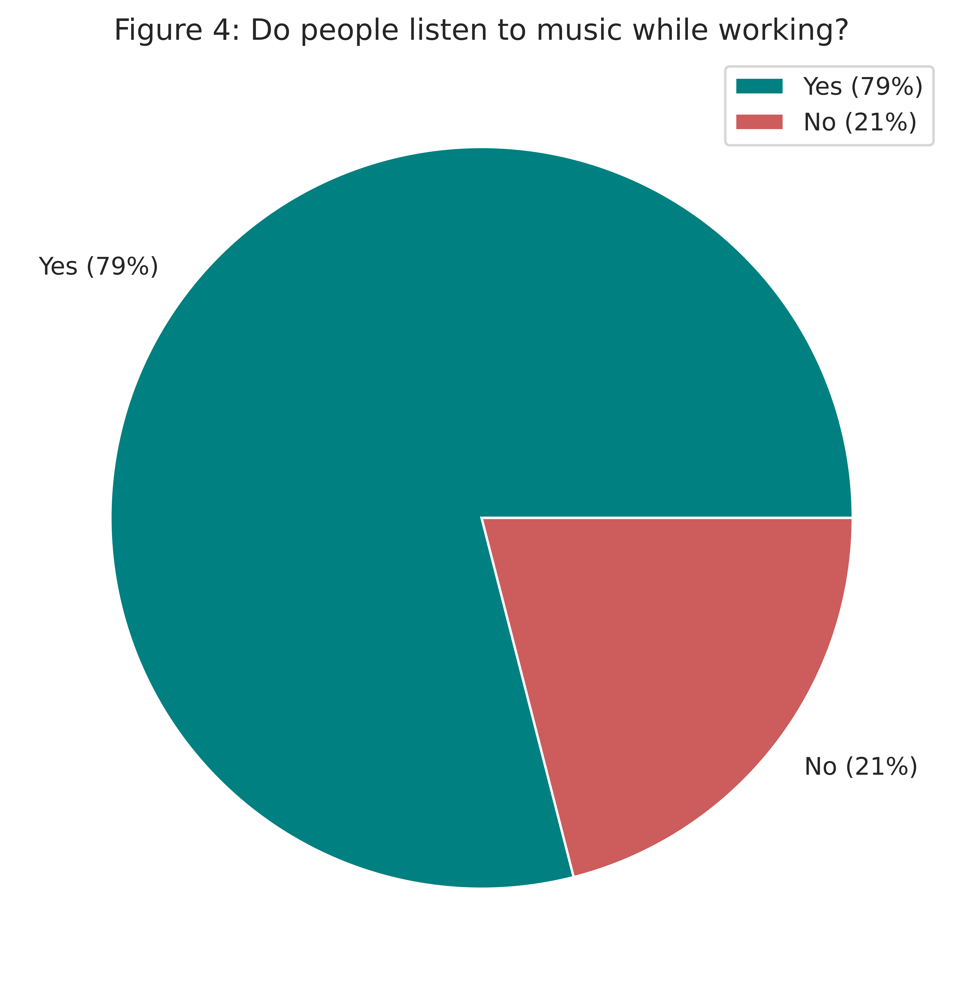

In [137]:
#Figure 4: Do people listen to music while working? 
#Rather than using the MatPlotLib, this time Seaborn has been used to draw a pie chart for the number of respondents who listen to music in their workplaces.
#The data used here has been taken from the preceding calculation.

plt.figure(figsize=(12, 7), 
           dpi = 1200),  

data = [579, 154]
keys = ['Yes (79%)', 'No (21%)']
  
palette_color = sns.color_palette('bright')
  
plt.pie(data, labels=keys, colors=['teal','indianred'])
plt.legend()
plt.title('Figure 4: Do people listen to music while working?',fontsize=12)

plt.show()

In [60]:
#Calling the .value_counts() feature to fetch the number of people who can play musical instruments from the dataset

cs['Instrumentalist'].value_counts()

No     497
Yes    235
Name: Instrumentalist, dtype: int64

In [141]:
#Figure 5: How many of the surveyed can play instruments?
#Again by using the MatPlotLib, a ratio chart for the number of respondents who can play musical instrumets, is being drawn.
#The data used here has been taken from the preceding calculation.

plt.figure(figsize=(10,5), 
           dpi = 1200) 
plt.tick_params(labelsize = 25)

names = ['Instrumentalist: No (67.89%)', 'Instrumentalist: Yes (32.10%)']
size = [497,235]
 
my_circle = plt.Circle( (0,0), 0.7, color='white')

plt.pie(size, labels=names, colors=['purple','teal'])
ax = plt.gcf()
ax.gca().add_artist(my_circle)
ax.legend()
plt.title('Figure 5: How many of the surveyed can play instruments?',fontsize=11)

plt.show()

In [50]:
#Calling the .value_counts() feature to fetch the number of people who can compose original music

cs['Composer'].value_counts()

No     609
Yes    126
Name: Composer, dtype: int64

In [155]:
#Figure 6: How many of the surveyed can compose music?
#Again by using the MatPlotLib, a ratio chart for the number of respondents who can compose music, is being drawn here.
#The data used in this chart has been taken from the preceding calculation.

plt.figure(figsize=(10,5), 
           dpi = 1200) 
plt.tick_params(labelsize = 25)

names = ['Composer: No (82.85%)', 'Composer: Yes (17.14%)']
size = [609,126]
 
my_circle = plt.Circle( (0,0), 0.7, color='white')

plt.pie(size, labels=names, colors=['indianred','gold'])
ax = plt.gcf()
ax.gca().add_artist(my_circle)
ax.legend()
plt.title('Figure 6: How many of the surveyed can compose music?',fontsize=12)


plt.show()

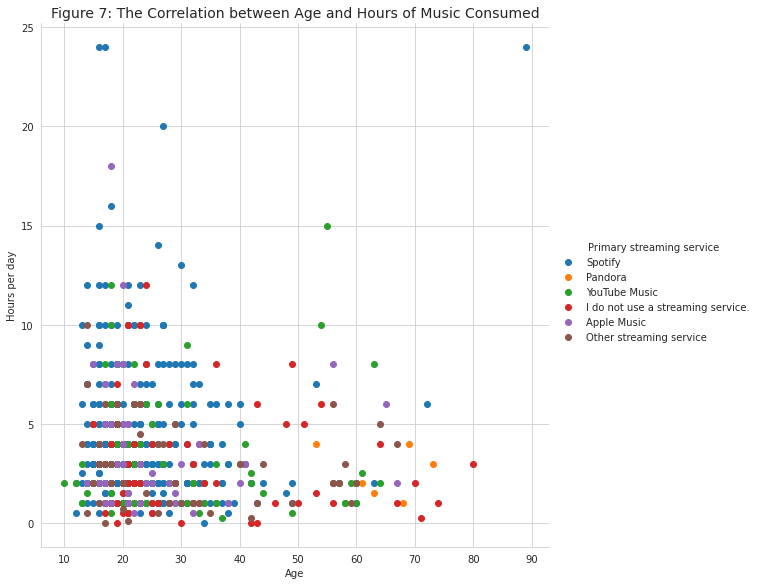

In [159]:
#Figure 7: The Correlation between Age and Hours of Music Consumed
#Seaborn's scatterplot tool has been called here to measure the corelation between the respondents' age, hours of music listening and the streaming services used.

sns.set_style("whitegrid")
sns.FacetGrid(cs, hue="Primary streaming service", height=8) \
   .map(plt.scatter, "Age", "Hours per day") \
   .add_legend()
plt.title('Figure 7: The Correlation between Age and Hours of Music Consumed',fontsize=14)
plt.show()

In [162]:
#Figure 8: Genres of preference according to the age
#Seaborn's boxplot tool has been called here to measure the corelation between the respondents' age and musical taste

plt.figure(figsize=(12, 7), 
           dpi = 1200)

ax= sns.boxplot(data=cs, x="Age", y="Fav genre")
ax.set_title('Favourite Genres across Age Groups',fontsize=15)
plt.title('Figure 8: Genres of preference according to the age',fontsize=17)

plt.show()

In [67]:
#Figure 9:Prevalence of Mental Health Disorders in US (1990-2019)
#The visualisation has been created from the Dataset 1. The relevant code for that one is in the ipynb file titled: Dataset1= share-with-mental-and-substance-disorders.

The next few lines of code has been written to make the dataset fit for drawing a correlation between the nature of mental illness and the taste of music. 

In [68]:
#Loading the dataset but by only using the specific columns effective for the visualisation
cs2= pd.read_csv('mxmh_survey_results.csv', usecols=[11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30], nrows=736)

#Calling the dataset to check the revised structure
cs2

,Frequency [Classical],Frequency [Country],Frequency [EDM],Frequency [Folk],Frequency [Gospel],Frequency [Hip hop],Frequency [Jazz],Frequency [K pop],Frequency [Latin],Frequency [Lofi],Frequency [Metal],Frequency [Pop],Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD
0,Rarely,Never,Rarely,Never,Never,Sometimes,Never,Very frequently,Very frequently,Rarely,Never,Very frequently,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0
1,Sometimes,Never,Never,Rarely,Sometimes,Rarely,Very frequently,Rarely,Sometimes,Rarely,Never,Sometimes,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0
2,Never,Never,Very frequently,Never,Never,Rarely,Rarely,Very frequently,Never,Sometimes,Sometimes,Rarely,Never,Rarely,Rarely,Very frequently,7.0,7.0,10.0,2.0
3,Sometimes,Never,Never,Rarely,Sometimes,Never,Very frequently,Sometimes,Very frequently,Sometimes,Never,Sometimes,Sometimes,Never,Never,Never,9.0,7.0,3.0,3.0
4,Never,Never,Rarely,Never,Rarely,Very frequently,Never,Very frequently,Sometimes,Sometimes,Never,Sometimes,Very frequently,Very frequently,Never,Rarely,7.0,2.0,5.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,Very frequently,Rarely,Never,Sometimes,Never,Sometimes,Rarely,Never,Sometimes,Rarely,Rarely,Very frequently,Never,Rarely,Very frequently,Never,7.0,6.0,0.0,9.0
732,Rarely,Rarely,Never,Never,Never,Never,Rarely,Never,Never,Rarely,Never,Very frequently,Never,Never,Sometimes,Sometimes,3.0,2.0,2.0,5.0
733,Rarely,Sometimes,Sometimes,Rarely,Rarely,Very frequently,Rarely,Rarely,Rarely,Sometimes,Rarely,Sometimes,Sometimes,Sometimes,Rarely,Rarely,2.0,2.0,2.0,2.0
734,Very frequently,Never,Never,Never,Never,Never,Rarely,Never,Never,Never,Never,Never,Never,Never,Never,Sometimes,2.0,3.0,2.0,1.0


In [69]:
#Simplifying the column names using the .rename command. This step will help people perceive the data clearly.

cs2.rename(columns={"Frequency [Classical]": "Classical"}, inplace=True)
cs2.rename(columns={"Frequency [Country]": "Country"}, inplace=True)
cs2.rename(columns={"Frequency [EDM]": "EDM"}, inplace=True)
cs2.rename(columns={"Frequency [Folk]": "Folk"}, inplace=True)
cs2.rename(columns={"Frequency [Gospel]": "Gospel"}, inplace=True)
cs2.rename(columns={"Frequency [Hip hop]": "Hip hop"}, inplace=True)
cs2.rename(columns={"Frequency [Jazz]": "Jazz"}, inplace=True)
cs2.rename(columns={"Frequency [K pop]": "K pop"}, inplace=True)
cs2.rename(columns={"Frequency [Latin]": "Latin"}, inplace=True)
cs2.rename(columns={"Frequency [Lofi]": "Lofi"}, inplace=True)
cs2.rename(columns={"Frequency [Metal]": "Metal"}, inplace=True)
cs2.rename(columns={"Frequency [Pop]": "Pop"}, inplace=True)
cs2.rename(columns={"Frequency [R&B]": "R&B"}, inplace=True)
cs2.rename(columns={"Frequency [Rap]": "Rap"}, inplace=True)
cs2.rename(columns={"Frequency [Rock]": "Rock"}, inplace=True)
cs2.rename(columns={"Frequency [Video game music]": "Video game music"}, inplace=True)

#Calling the dataset to make sure the edits have been applied

cs2

,Classical,Country,EDM,Folk,Gospel,Hip hop,Jazz,K pop,Latin,Lofi,Metal,Pop,R&B,Rap,Rock,Video game music,Anxiety,Depression,Insomnia,OCD
0,Rarely,Never,Rarely,Never,Never,Sometimes,Never,Very frequently,Very frequently,Rarely,Never,Very frequently,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0
1,Sometimes,Never,Never,Rarely,Sometimes,Rarely,Very frequently,Rarely,Sometimes,Rarely,Never,Sometimes,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0
2,Never,Never,Very frequently,Never,Never,Rarely,Rarely,Very frequently,Never,Sometimes,Sometimes,Rarely,Never,Rarely,Rarely,Very frequently,7.0,7.0,10.0,2.0
3,Sometimes,Never,Never,Rarely,Sometimes,Never,Very frequently,Sometimes,Very frequently,Sometimes,Never,Sometimes,Sometimes,Never,Never,Never,9.0,7.0,3.0,3.0
4,Never,Never,Rarely,Never,Rarely,Very frequently,Never,Very frequently,Sometimes,Sometimes,Never,Sometimes,Very frequently,Very frequently,Never,Rarely,7.0,2.0,5.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,Very frequently,Rarely,Never,Sometimes,Never,Sometimes,Rarely,Never,Sometimes,Rarely,Rarely,Very frequently,Never,Rarely,Very frequently,Never,7.0,6.0,0.0,9.0
732,Rarely,Rarely,Never,Never,Never,Never,Rarely,Never,Never,Rarely,Never,Very frequently,Never,Never,Sometimes,Sometimes,3.0,2.0,2.0,5.0
733,Rarely,Sometimes,Sometimes,Rarely,Rarely,Very frequently,Rarely,Rarely,Rarely,Sometimes,Rarely,Sometimes,Sometimes,Sometimes,Rarely,Rarely,2.0,2.0,2.0,2.0
734,Very frequently,Never,Never,Never,Never,Never,Rarely,Never,Never,Never,Never,Never,Never,Never,Never,Sometimes,2.0,3.0,2.0,1.0


In [70]:
#Using the .replace command, the following four categorical values have been transformed on a numeric scale of 0 to 3 to measure correlation.

cs2.replace(['Never', 'Rarely', 'Sometimes', 'Very frequently'],
                        [0, 1, 2, 3], inplace=True)

#Calling the dataset to make sure the edits have been applied

cs2

,Classical,Country,EDM,Folk,Gospel,Hip hop,Jazz,K pop,Latin,Lofi,Metal,Pop,R&B,Rap,Rock,Video game music,Anxiety,Depression,Insomnia,OCD
0,1,0,1,0,0,2,0,3,3,1,0,3,2,3,0,2,3.0,0.0,1.0,0.0
1,2,0,0,1,2,1,3,1,2,1,0,2,2,1,3,1,7.0,2.0,2.0,1.0
2,0,0,3,0,0,1,1,3,0,2,2,1,0,1,1,3,7.0,7.0,10.0,2.0
3,2,0,0,1,2,0,3,2,3,2,0,2,2,0,0,0,9.0,7.0,3.0,3.0
4,0,0,1,0,1,3,0,3,2,2,0,2,3,3,0,1,7.0,2.0,5.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,3,1,0,2,0,2,1,0,2,1,1,3,0,1,3,0,7.0,6.0,0.0,9.0
732,1,1,0,0,0,0,1,0,0,1,0,3,0,0,2,2,3.0,2.0,2.0,5.0
733,1,2,2,1,1,3,1,1,1,2,1,2,2,2,1,1,2.0,2.0,2.0,2.0
734,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2,2.0,3.0,2.0,1.0


In [166]:
#Figure 10: The Relationship between Music Taste and Mental Illness
#By using the above mentioned data, a Seaborn heatmap has been called to show the relationships between the nature of mental illness and the taste of music. 

plt.figure(figsize=(12, 7), 
           dpi = 1200),

cols_A = ['Classical','Country','EDM','Folk','Gospel','Hip hop','Jazz','K pop','Latin','Lofi','Metal','Pop','R&B','Rap','Rock','Video game music']
cols_B = ['Anxiety', 'Depression','Insomnia','OCD']
corr = cs2[cols_A + cols_B].corr()

ax= sns.heatmap(corr.loc[cols_A, cols_B], vmin=-1, vmax=1, cmap='RdYlGn', annot=True)
ax.set_title('Figure 10: The Relationship between Music Taste and Mental Illness',fontsize=16)
plt.tight_layout()


plt.show()

In [72]:
#Calling the .value_counts() again to calculate how listening to music effect on our mental weelbeing.

cs['Music effects'].value_counts()

Improve      542
No effect    169
Worsen        17
Name: Music effects, dtype: int64

In [180]:
#Figure 11: Does Music Listening Improve Mood?
#From pywaffle, waffle plotting has been called in here to visualise people's responses. on a waffle plot, the dominance of an opinion can be determined the volume of area that has occupied.

fig = plt.figure(
    FigureClass=Waffle, 
    rows=20, 
    values=[542,169,17],
    title={'label': 'Figure 11: Effects of Music on Mental Wellbeing',
           'loc':'center',
           'fontdict': {'fontsize':20}
          },
    labels=['Improve (74.45%)','No effect (23.21%)', 'Worsen (2.33%)'],
    figsize=(16, 7),
    dpi = 1200,
    legend={'bbox_to_anchor': (1.0, 1.2)}    
)

In [189]:
#Figure 12: Impact of Music Genres On Mental Health of Different Age Groups
# By using the Seaborn's plotting capabilities, a grouped chart has been created to show how the different types of music produce different response in varying age groups.

plt.figure(figsize=(12, 7), 
           dpi = 1200),
ax=sns.barplot(x= cs['Fav genre'], y= cs['Age'], hue= cs['Music effects'], errwidth=0, palette='gist_yarg')
plt.xticks(rotation=75)
ax.set_title('Figure 12: Effects of Specific Genres of Music on Mental Wellbeing',fontsize=18)
plt.show()